Digite o fator de UpScaling: 2
Digite o fator de DownScaling: 2


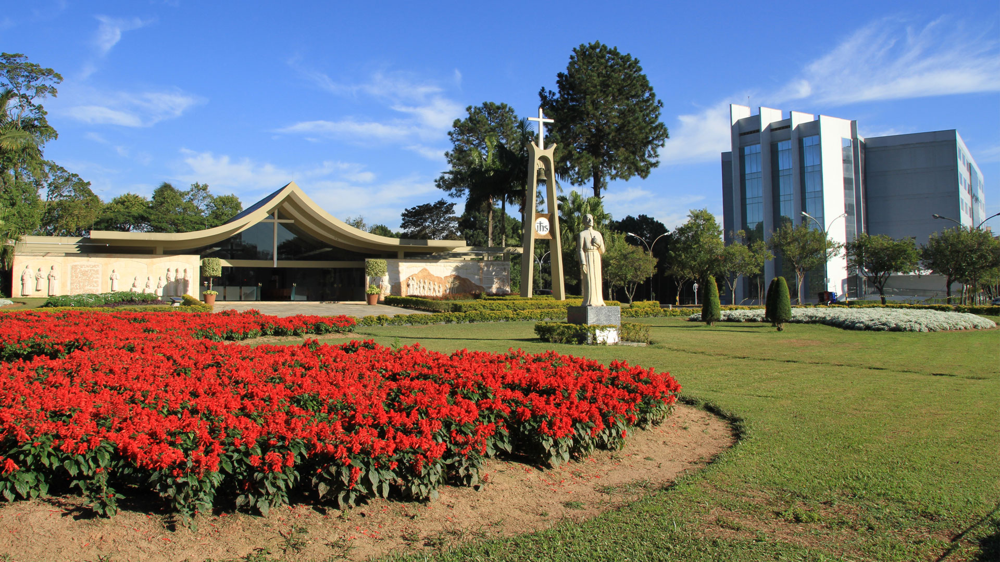

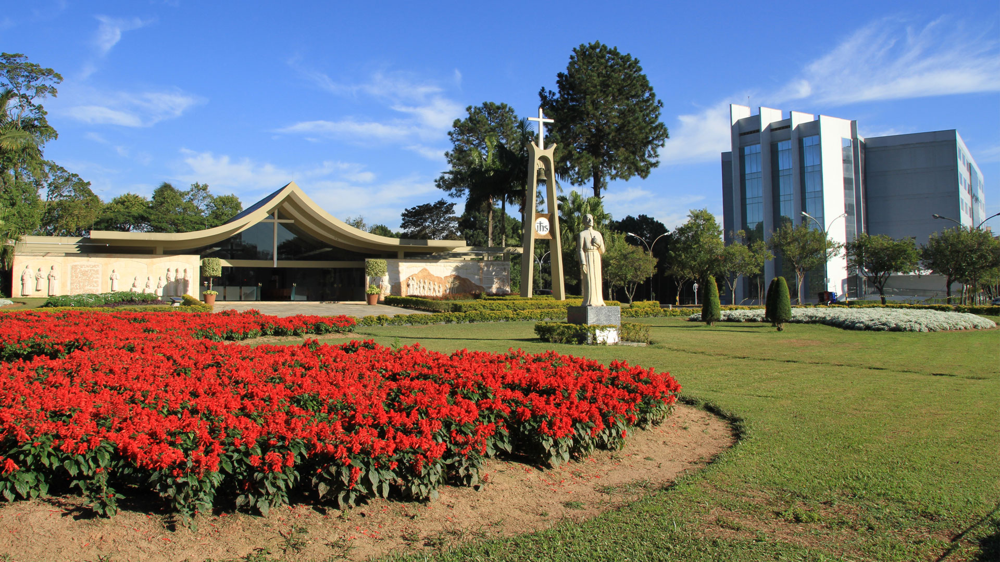

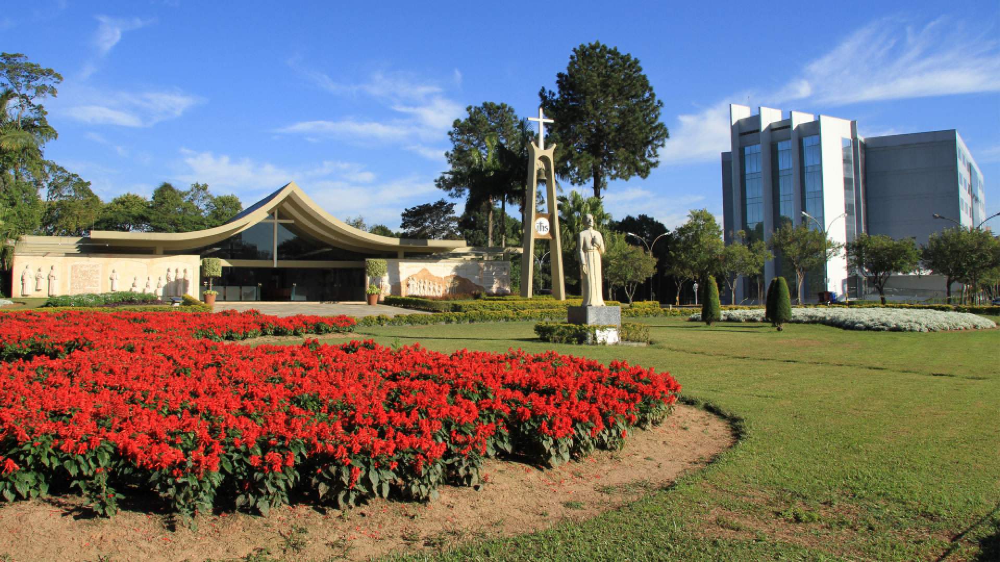

In [ ]:
import cv2
import numpy as np

# Load the image
Im = cv2.imread('capela.jpg')
Im = Im.astype(np.float64)

# N = input('Digite o fator de scaling: ')
N = 1

V, H, _ = Im.shape

V = V - V % N
H = H - H % N

Im = Im[:V, :H, :]

from google.colab.patches import cv2_imshow

cv2.waitKey(0)
cv2.destroyAllWindows()

Nu = int(input('Digite o fator de UpScaling: '))
Nd = int(input('Digite o fator de DownScaling: '))

def DownScaling1(Im, N):
    return Im[::N, ::N, :]

def DownScaling2(Im, N):
    V, H, _ = Im.shape
    Im_Ds2 = np.zeros((V // N, H // N, 3), dtype=np.float64)
    for L in range(N):
        for C in range(N):
            Im_Ds2 += Im[L::N, C::N, :]
    Im_Ds2 /= N ** 2
    return Im_Ds2

def UpScaling1(Im, N):
    V, H, _ = Im.shape
    Im_Us1 = np.zeros((V * N, H * N, 3), dtype=np.float64)
    for L in range(N):
        for C in range(N):
            Im_Us1[L::N, C::N, :] = Im
    return Im_Us1

def UpScaling2(Im):
    N = 2
    V, H, _ = Im.shape
    Im_Us2 = np.zeros((V * N, H * N, 3), dtype=np.float64)
    Im_Us2[::N, ::N, :] = Im
    Im_Us2[:, 1::N, :] = ((Im_Us2[:, :-2:N, :] + Im_Us2[:, 2::N, :]) / 2).astype(np.uint8)
    Im_Us2[1::N, :, :] = ((Im_Us2[:-2:N, :, :] + Im_Us2[2::N, :, :]) / 2).astype(np.uint8)
    return Im_Us2

Im1 = DownScaling2(UpScaling1(Im, Nu), Nd)
Im2 = UpScaling1(DownScaling2(Im, Nd), Nu)


cv2_imshow(Im.astype(np.uint8))
cv2_imshow(Im1.astype(np.uint8))
cv2_imshow(Im2.astype(np.uint8))
cv2.waitKey(0)
cv2.destroyAllWindows()